# 1. Clone the VAE repo
- This VAE model is a A **Basic** variational autoencoder
- Trained on the CelebA dataset (a large-scale dataset of over 200,000 celebrity face images)

In [1]:
!git clone https://github.com/moshesipper/vae-torch-celeba.git

Cloning into 'vae-torch-celeba'...
remote: Enumerating objects: 50, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 50 (delta 22), reused 26 (delta 12), pack-reused 14 (from 1)
Receiving objects: 100% (50/50), 28.72 MiB | 23.82 MiB/s, done.
Resolving deltas: 100% (23/23), done.


In [2]:
!mv /content/vae-torch-celeba/* /content/

# 2. Import needed dependencies

In [3]:
import os
import sys
import torch
from torch import nn
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.utils import make_grid
from diffusers import StableDiffusionImg2ImgPipeline
from torch.serialization import safe_globals
from vae import VAE, celeb_transform, IMAGE_SIZE


CELEB_PATH ./data/ IMAGE_SIZE 150 LATENT_DIM 128 image_dim 67500


# 3. Setting up the model

In [4]:
model = VAE()
model_path = "/content/vae_model_20.pth"

with safe_globals([VAE]):
    # The model was developed with an older PyTorch version, so safe_globals is needed
    # to mitigate errors when loading the class structure.
    model = torch.load(model_path, map_location=torch.device('cpu'), weights_only=False)
model.eval()

VAE(
  (encoder): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (4): Sequentia

# 4. Generate 10 different images from a single base image and explore different diversity factors

Generating images with a diversity factor of 1.0...
Generating images with a diversity factor of 2.0...
Generating images with a diversity factor of 3.0...
Generating images with a diversity factor of 4.0...
Generating images with a diversity factor of 5.0...
Generating images with a diversity factor of 6.0...
Generating images with a diversity factor of 7.0...
Generating images with a diversity factor of 8.0...
Generating images with a diversity factor of 9.0...
Generating images with a diversity factor of 10.0...


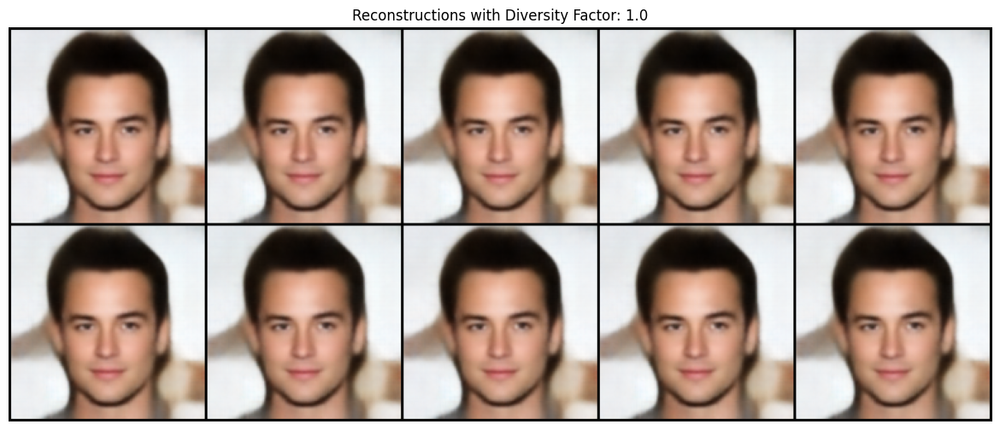

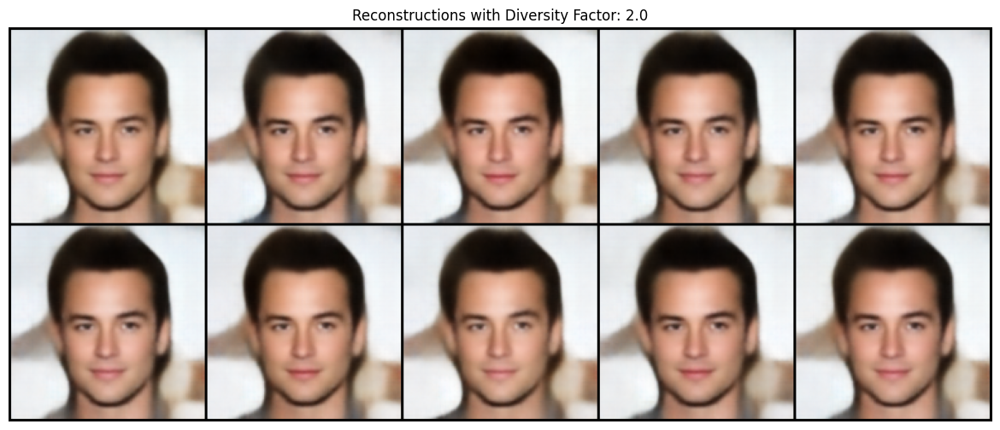

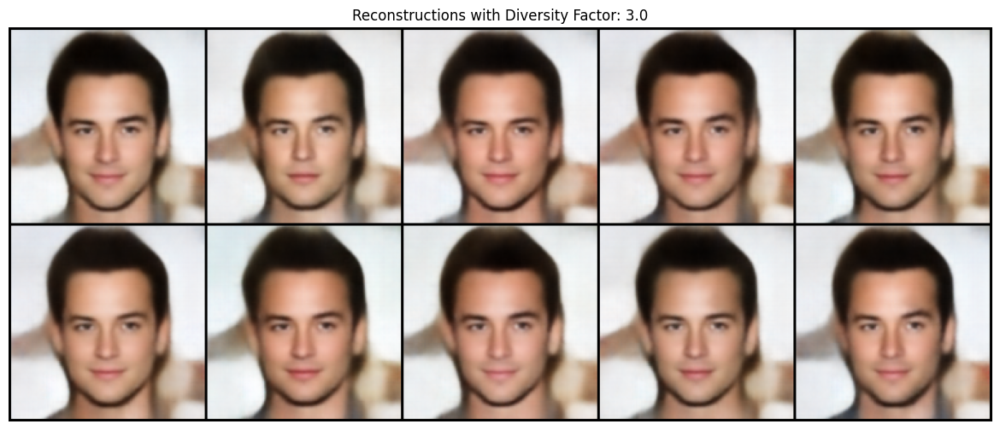

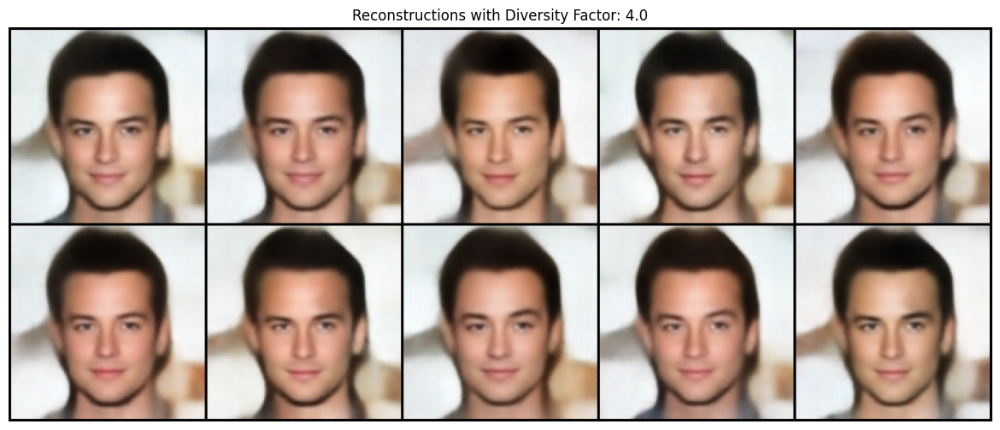

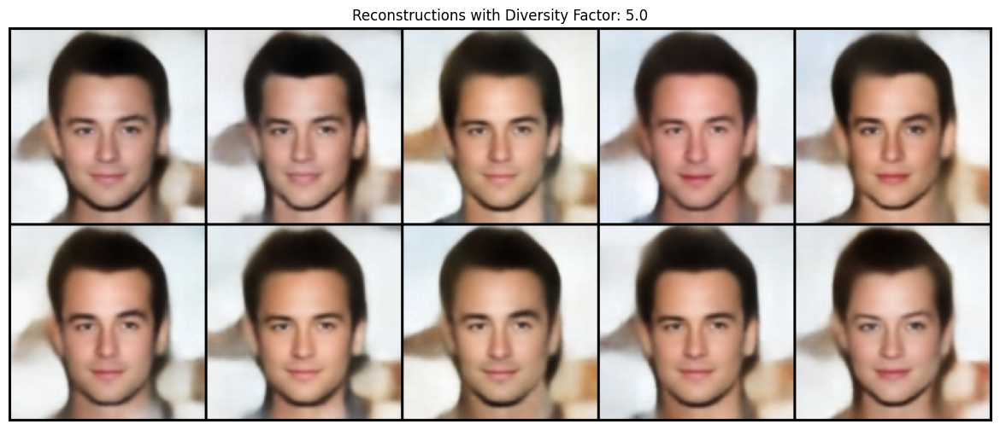

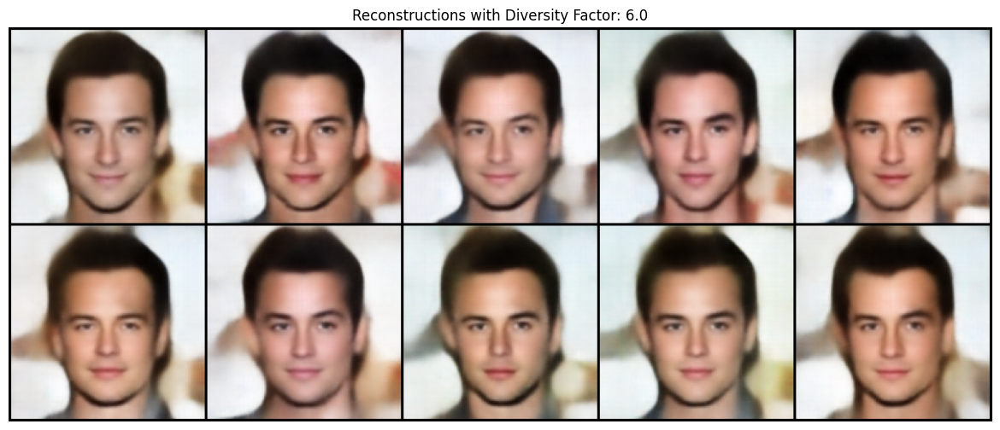

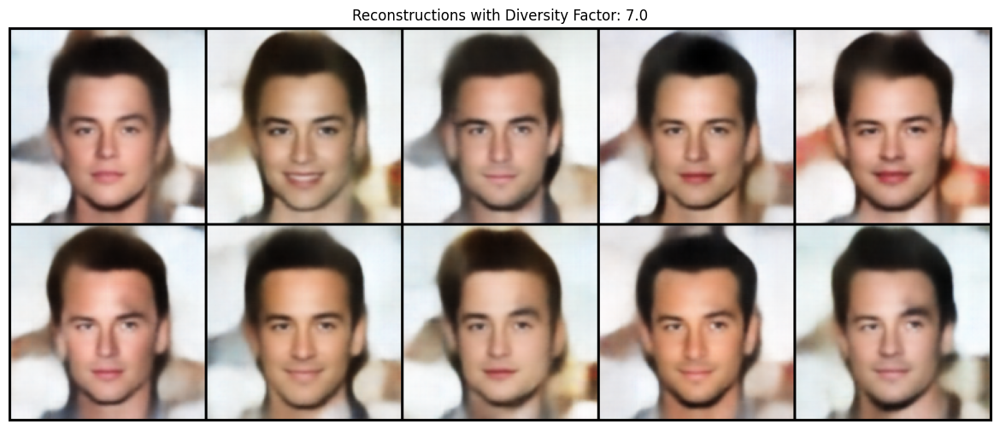

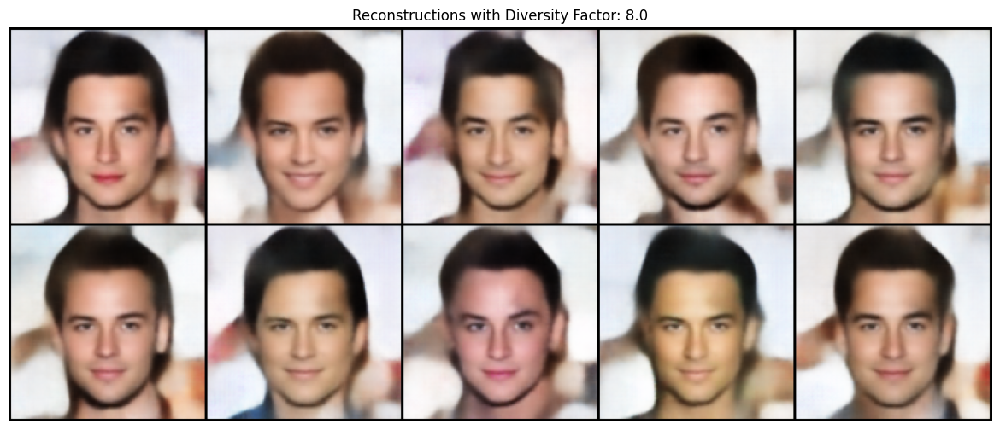

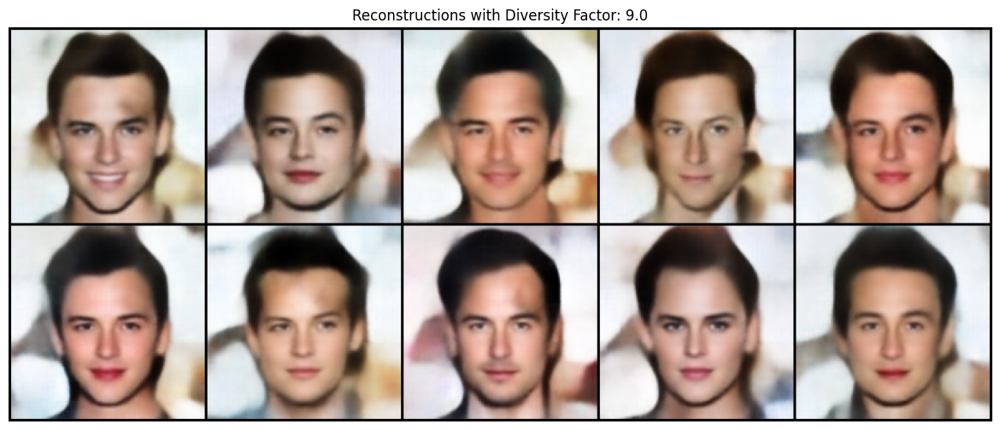

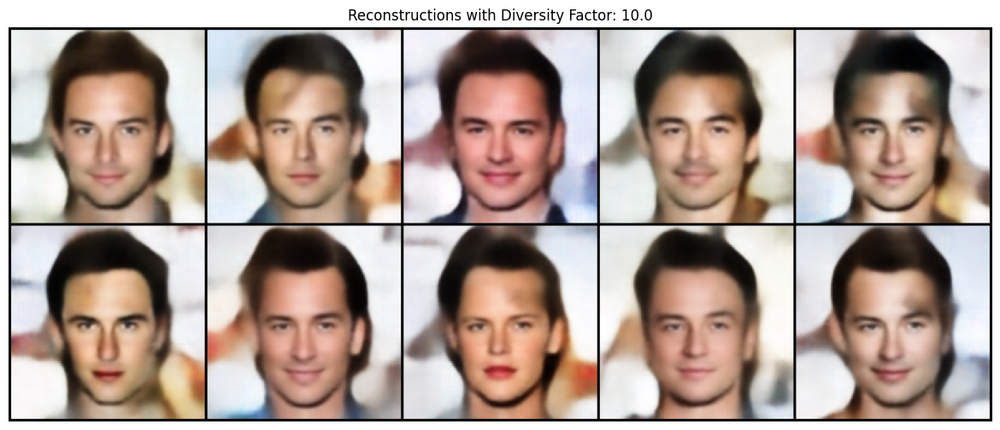

In [6]:
seed_value = 100 # for reproducibility
torch.manual_seed(seed_value)
# 1. Load the base face image
image_path = "/content/000007.jpg"
image = Image.open(image_path).convert("RGB")

# 2. Transform and encode the image to get its distribution (mu, log_var)
encoder_input = celeb_transform(image).unsqueeze(0)
mu, log_var = model.encode(encoder_input)

diversity_factors = [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]
all_generated_images = []

for diversity_factor in diversity_factors:
    print(f"Generating images with a diversity factor of {diversity_factor}...")
    generated_images = []
    for i in range(10):
        # The sequence of 'eps' tensors will now be the same every time you run the script
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        z = mu + (eps * std * diversity_factor)

        # decode and reshape
        decoder_output = model.decode(z)
        reconstructed_image_tensor = decoder_output.view(3, IMAGE_SIZE, IMAGE_SIZE)
        generated_images.append(reconstructed_image_tensor)
    all_generated_images.append(generated_images)

# Display all images
for diversity_factor, generated_images in zip(diversity_factors, all_generated_images):
    grid = make_grid(generated_images, nrow=5, padding=2, normalize=True)
    grid_to_display = grid.permute(1, 2, 0)

    plt.figure(figsize=(15, 6))
    plt.imshow(grid_to_display.cpu().detach().numpy())
    plt.title(f"Reconstructions with Diversity Factor: {diversity_factor}")
    plt.axis("off")
    plt.show()

Generating 10 reproducible images with the chosen diversity factor of 7.0...
Image generation complete.


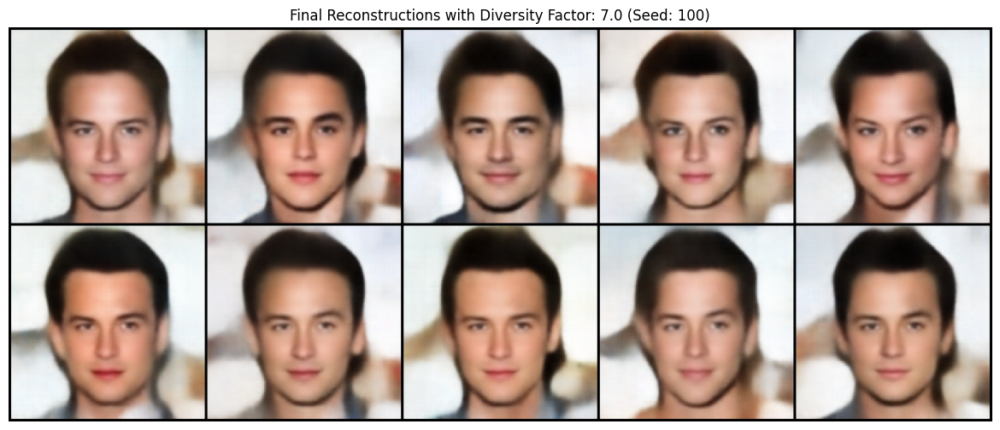

In [7]:
import torch
from PIL import Image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
# generate the final 10 images with the chosen diversity factor
# factor of 7 gives a good balance between diversity and reality
diversity_factor = 7.0

print(f"Generating 10 reproducible images with the chosen diversity factor of {diversity_factor}...")
num_images_to_generate = 10
generated_images = []

for i in range(num_images_to_generate):
    std = torch.exp(0.5 * log_var)
    eps = torch.randn_like(std)
    z = mu + (eps * std * diversity_factor)
    decoder_output = model.decode(z)
    reconstructed_image_tensor = decoder_output.view(3, IMAGE_SIZE, IMAGE_SIZE)
    generated_images.append(reconstructed_image_tensor)

print("Image generation complete.")

grid = make_grid(generated_images, nrow=5, padding=2, normalize=True)
grid_to_display = grid.permute(1, 2, 0)

plt.figure(figsize=(15, 6))
plt.imshow(grid_to_display.cpu().detach().numpy())
plt.title(f"Final Reconstructions with Diversity Factor: {diversity_factor} (Seed: {seed_value})")
plt.axis("off")
plt.show()


# save all images
for i, image in enumerate(generated_images):
    image_to_save = image.permute(1, 2, 0).cpu().detach().numpy()
    image_to_save = Image.fromarray((image_to_save * 255).astype('uint8'))
    image_to_save.save(f"generated_image_{i}.png")

# 5. The nature of the loss function of the VAE interduces the blurry back ground and the diffusers are one of the arcterctures solving this problem as shown in the following example

In [11]:
 #1. load the pre-trained model
 # you will need Hugging Face Authentication
device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to(device)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Generating 10 images with strength=0.2 and base_seed=100...
Generating image 1/10 with seed 100...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 2/10 with seed 101...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 3/10 with seed 102...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 4/10 with seed 103...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 5/10 with seed 104...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 6/10 with seed 105...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 7/10 with seed 106...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 8/10 with seed 107...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 9/10 with seed 108...


  0%|          | 0/10 [00:00<?, ?it/s]

Generating image 10/10 with seed 109...


  0%|          | 0/10 [00:00<?, ?it/s]


Image generation complete.


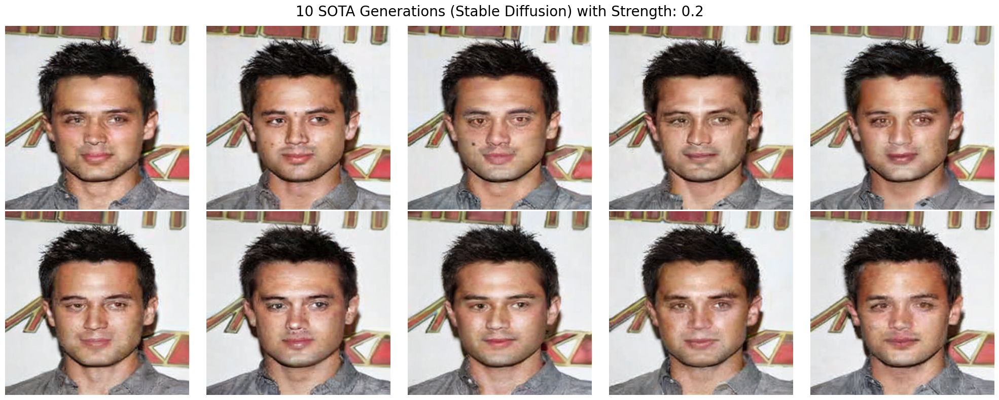

In [12]:
from diffusers import StableDiffusionImg2ImgPipeline
from torchvision.utils import make_grid, save_image

image_path = "/content/000007.jpg"
init_image = Image.open(image_path).convert("RGB").resize((512, 512))

prompt = "a high-resolution photograph of a person's face, photorealistic, 4k, sharp details"
strength = 0.2
num_images_to_generate = 10
base_seed = 100 # The starting seed for the entire generation process.


generated_images = []
print(f"Generating {num_images_to_generate} images with strength={strength} and base_seed={base_seed}...")

for i in range(num_images_to_generate):
    # seed for each image to get unique results
    current_seed = base_seed + i
    print(f"Generating image {i+1}/{num_images_to_generate} with seed {current_seed}...")
    generator = torch.Generator(device=device).manual_seed(current_seed)

    sota_image = pipe(
        prompt=prompt,
        image=init_image,
        strength=strength,
        generator=generator
    ).images[0]

    generated_images.append(sota_image)

print("\nImage generation complete.")


fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for img, ax in zip(generated_images, axes):
    ax.imshow(img)
    ax.axis('off')

plt.suptitle(f"10 SOTA Generations (Stable Diffusion) with Strength: {strength}", fontsize=20)
plt.tight_layout()
plt.show()